# **Libraries**

In [1]:
!pip install python-Levenshtein

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.4/169.4 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 9.5 MB/s eta 0:00:00


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import torch as pt
import Levenshtein as lev

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [26]:
!ls drive/MyDrive/Oslo/data/ireceptor/output/esm2

H_CDR3.pt  old	TSNE_H_CDR3.pkl  UMAP_H_CDR3.pkl


# **Prepare all_data datasets**

## **Merge metadata**

In [ ]:
# Load covabdab metadata df
covabdab_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/covabdab/covabdab.csv', sep=',')
columns_to_keep = ['Protein + Epitope', 'CDRH3', 'Heavy V Gene', 'Heavy J Gene']
columns_to_drop = covabdab_metadata.columns.difference(columns_to_keep)
covabdab_metadata = covabdab_metadata.drop(columns=columns_to_drop)
covabdab_metadata = covabdab_metadata.rename(columns={'Heavy V Gene': 'v_call', 'Heavy J Gene': 'j_call', 'CDRH3': 'junction_aa'})
covabdab_metadata['dataset'] = 'covabdab'
covabdab_metadata['id'] = range(1, len(covabdab_metadata) + 1)

covabdab_metadata

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5
...,...,...,...,...,...,...
12530,S; RBD,IGHV3-21 (Human),IGHJ5 (Human),CARDRFGEFIYPGALDIW,covabdab,12531
12531,S; RBD,IGHV1-58 (Human),IGHJ2 (Human),CAAMVRGGWWYFDLW,covabdab,12532
12532,S; RBD,IGHV3-11 (Human),IGHJ1 (Human),CASDPGGLSELAAEYFHHW,covabdab,12533
12533,S; RBD,IGHV3-64 (Human),IGHJ2 (Human),CARESTEVTHWYFDLW,covabdab,12534


In [ ]:
# Load trastuzumab metadata df
trastuzumab_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/trastuzumab/Merged_unique.csv', sep=',')
trastuzumab_metadata = trastuzumab_metadata.rename(columns={'count': 'duplicate_count', 'aa_cdr3_seq': 'junction_aa'})
trastuzumab_metadata['dataset'] = 'trastuzumab'

trastuzumab_metadata

,junction_aa,duplicate_count,affinity,id,dataset
0,CSRIASVAFTCSLYW,14426,lb,1,trastuzumab
1,CSRIASGLLTLYHYW,10086,lb,2,trastuzumab
2,CSRWATFGLYAHRYW,9139,lb,3,trastuzumab
3,CSRWSMFGLYTFCYW,8237,lb,4,trastuzumab
4,CSRYVTNGFYAYHYW,8063,lb,5,trastuzumab
...,...,...,...,...,...
524341,CSRWYVSCFYVNPYW,2,mb,524342,trastuzumab
524342,CSRYAIRGHYQFLYW,2,mb,524343,trastuzumab
524343,CSRFSESSCYDIRYW,2,mb,524344,trastuzumab
524344,CSRFSGGHFYMLDYW,2,mb,524345,trastuzumab


In [ ]:
# Load ireceptor metadata df
ireceptor_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/ireceptor/H_CDR3.csv', sep=';')
columns_to_keep = ['v_call', 'j_call', 'd_call', 'c_call', 'junction_aa', 'id', 'duplicate_count', 'repertoire_id']
columns_to_drop = ireceptor_metadata.columns.difference(columns_to_keep)
ireceptor_metadata = ireceptor_metadata.drop(columns=columns_to_drop)
ireceptor_metadata['dataset'] = 'ireceptor'

ireceptor_metadata

,v_call,d_call,j_call,c_call,junction_aa,duplicate_count,repertoire_id,id,dataset
0,IGHV3-23*01,IGHD3-16*01,IGHJ4*02,IgM,CAKCGDGIYADYYFDYW,NaN,4941241542787076586-242ac113-0001-012,1,ireceptor
1,IGHV3-30*18,IGHD4-17*01,IGHJ4*02,IgM,CAKGGGTVTTGGFDYW,NaN,4250138355187716586-242ac113-0001-012,2,ireceptor
2,IGHV3-23*01,IGHD3-22*01,IGHJ5*02,IgM,CAKDSSAWSKDSW,NaN,401804708298756586-242ac113-0001-012,3,ireceptor
3,IGHV4-59*10,IGHD3-22*01,IGHJ4*02,IgM,CARETYYYDSSGYYINYFDYW,NaN,1025069326778428950-242ac113-0001-012,4,ireceptor
4,IGHV4-31*03,IGHD3-10*01,IGHJ4*02,IgM,CAREGVNRTWFGELSPPYFDYW,NaN,2690893428047876586-242ac113-0001-012,5,ireceptor
...,...,...,...,...,...,...,...,...,...
799995,IGHV1-8*02,IGHD3-22*01,IGHJ4*02,IgM,CARGTIAVANDYW,NaN,1279975635796028950-242ac113-0001-012,799996,ireceptor
799996,IGHV3-30*04,IGHD3-16*01,IGHJ3*02,IgG1,CARVPDFGELQLFAYDIW,NaN,667104838172676586-242ac113-0001-012,799997,ireceptor
799997,IGHV4-59*01,IGHD3-10*02,IGHJ4*02,IgM,CARASVLLSADFW,NaN,1137382721568828950-242ac113-0001-012,799998,ireceptor
799998,IGHV1-2*03,IGHD2-8*02,IGHJ4*02,IgM,CARVRVVNSKAFDYW,NaN,891281095508028950-242ac113-0001-012,799999,ireceptor


In [ ]:
# Load Maria's metadata df
maria_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/maria/maria.csv', sep=';')

maria_metadata

,duplicate_count,junction_aa,id,dataset
0,1.0,CARCAYYYDSSGYYYLRAFDYW,1,maria
1,1.0,CAKAIKLLRFLEWRKEGPRGQPGTADRENVLPIYYYYGMDVW,2,maria
2,1.0,CAKRLPQVVPAAGYRRSNWHPQTNWFDPW,3,maria
3,1.0,CIVVYDILTGYKIDYW,4,maria
4,1.0,CARYPSLAYFDYW,5,maria
...,...,...,...,...
799995,1.0,CASLAGITIFGVVIMQIRYW,799996,maria
799996,1.0,CVRNNTKGYSSSWFVAFDIW,799997,maria
799997,1.0,CATSSGSANYYYYYMDVW,799998,maria
799998,1.0,CAKGDPEIITMIVVVTKISLYW,799999,maria


In [ ]:
merged = pd.concat([covabdab_metadata, trastuzumab_metadata, ireceptor_metadata, maria_metadata], axis=0)
merged

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
799995,NaN,NaN,NaN,CASLAGITIFGVVIMQIRYW,maria,799996,1.0,NaN,NaN,NaN,NaN
799996,NaN,NaN,NaN,CVRNNTKGYSSSWFVAFDIW,maria,799997,1.0,NaN,NaN,NaN,NaN
799997,NaN,NaN,NaN,CATSSGSANYYYYYMDVW,maria,799998,1.0,NaN,NaN,NaN,NaN
799998,NaN,NaN,NaN,CAKGDPEIITMIVVVTKISLYW,maria,799999,1.0,NaN,NaN,NaN,NaN


## **Add WT Trastuzumab sequence, drop duplicates**

1. Preprocess the sequence with esm2
2. Add the .pt vector to all_data.pt
3. Run UMAP once again
4. Merge metadata and the new UMAP.pkl

In [ ]:
filtered = merged.drop_duplicates(subset=['junction_aa'], keep='first')

# Create WT trastuzumab row to append
new_data = pd.DataFrame({"duplicate_count": [1], "junction_aa": ["CSRWGGDGFYAMDYW"], "dataset": ["trastuzumab"], "affinity": ["hb"]})
# Append the new data to the dataframe
filtered = filtered.append(new_data, ignore_index=True)

filtered['id'] = range(1, len(filtered) + 1)
filtered['junction_length'] = filtered['junction_aa'].apply(len)

filtered

<ipython-input-80-bacaa1e9ddf7>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  filtered = filtered.append(new_data, ignore_index=True)


,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id,junction_length
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN,13
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN,17
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN,17
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN,15
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN,14
...,...,...,...,...,...,...,...,...,...,...,...,...
2134046,NaN,NaN,NaN,CVRNNTKGYSSSWFVAFDIW,maria,2134047,1.0,NaN,NaN,NaN,NaN,20
2134047,NaN,NaN,NaN,CATSSGSANYYYYYMDVW,maria,2134048,1.0,NaN,NaN,NaN,NaN,18
2134048,NaN,NaN,NaN,CAKGDPEIITMIVVVTKISLYW,maria,2134049,1.0,NaN,NaN,NaN,NaN,22
2134049,NaN,NaN,NaN,CASHPTTVTIHPHWFDPW,maria,2134050,1.0,NaN,NaN,NaN,NaN,18


In [ ]:
filtered.to_csv('/content/drive/MyDrive/Oslo/data/all_data.csv', index=False, sep=';')

with open('/content/drive/MyDrive/Oslo/data/all_data.fa', 'w') as file:
    for index, row in filtered.iterrows():
        id = row['id']
        cdr_aa = row['junction_aa']

        # Write the FASTA entry
        file.write(f'>{id}\n{cdr_aa}\n')

# **Load all_data dataset checkpoint**

In [32]:
filtered = pd.read_csv(f'/content/drive/MyDrive/Oslo/data/all_data/all_data.csv', sep=';')

filtered

<ipython-input-32-fe2c5395b612>:1: DtypeWarning: Columns (0,1,2,7,8,9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  filtered = pd.read_csv(f'/content/drive/MyDrive/Oslo/data/all_data/all_data.csv', sep=';')


,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id,junction_length
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN,13
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN,17
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN,17
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN,15
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN,14
...,...,...,...,...,...,...,...,...,...,...,...,...
2134046,NaN,NaN,NaN,CVRNNTKGYSSSWFVAFDIW,maria,2134047,1.0,NaN,NaN,NaN,NaN,20
2134047,NaN,NaN,NaN,CATSSGSANYYYYYMDVW,maria,2134048,1.0,NaN,NaN,NaN,NaN,18
2134048,NaN,NaN,NaN,CAKGDPEIITMIVVVTKISLYW,maria,2134049,1.0,NaN,NaN,NaN,NaN,22
2134049,NaN,NaN,NaN,CASHPTTVTIHPHWFDPW,maria,2134050,1.0,NaN,NaN,NaN,NaN,18


## **Add OLGA'S output**

In [28]:
# Load OLGA's output for all_data
with open(f'drive/MyDrive/Oslo/data/all_data/output/olga/pgen_H_CDR3.fa', 'r') as file:
    lines = file.readlines()
data = [line.strip().split('\t') for line in lines]
pgen_df = pd.DataFrame(data, columns=['junction_aa', 'pgen'])
#pgen_df['id'] = range(1, len(pgen_df) + 1)
pgen_df['pgen'] = pgen_df['pgen'].astype(float)
pgen_df['log_pgen'] = pgen_df['pgen'].apply(lambda x: np.log(x))
pgen_df['log_pgen'].replace(-np.inf, np.nan, inplace=True)

pgen_df

,junction_aa,pgen,log_pgen
0,CARDLVVYGLDYW,6.100901e-11,-23.520000
1,CAREFDLTKIIMVPPYW,5.055947e-21,-46.733722
2,CARDSSGWHWGVPFDYW,3.699200e-14,-30.928075
3,CVRGSGGIHDAFDIW,1.130567e-13,-29.810887
4,CARVDPRYEGFDYW,3.661061e-13,-28.635853
...,...,...,...
2134046,CVRNNTKGYSSSWFVAFDIW,2.570603e-20,-45.107561
2134047,CATSSGSANYYYYYMDVW,1.832625e-12,-27.025272
2134048,CAKGDPEIITMIVVVTKISLYW,6.965947e-20,-44.110668
2134049,CASHPTTVTIHPHWFDPW,3.170338e-15,-33.384938


In [38]:
# Rows in filtered which are not in pgen_df
missing_rows = filtered[~filtered['junction_aa'].isin(pgen_df['junction_aa'])]

missing_rows

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id,junction_length,pgen,log_pgen


In [37]:
filtered = pd.merge(filtered, pgen_df, on='junction_aa')

filtered

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id,junction_length,pgen,log_pgen
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN,13,6.100901e-11,-23.520000
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN,17,5.055947e-21,-46.733722
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN,17,3.699200e-14,-30.928075
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN,15,1.130567e-13,-29.810887
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN,14,3.661061e-13,-28.635853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134032,NaN,NaN,NaN,CVRNNTKGYSSSWFVAFDIW,maria,2134047,1.0,NaN,NaN,NaN,NaN,20,2.570603e-20,-45.107561
2134033,NaN,NaN,NaN,CATSSGSANYYYYYMDVW,maria,2134048,1.0,NaN,NaN,NaN,NaN,18,1.832625e-12,-27.025272
2134034,NaN,NaN,NaN,CAKGDPEIITMIVVVTKISLYW,maria,2134049,1.0,NaN,NaN,NaN,NaN,22,6.965947e-20,-44.110668
2134035,NaN,NaN,NaN,CASHPTTVTIHPHWFDPW,maria,2134050,1.0,NaN,NaN,NaN,NaN,18,3.170338e-15,-33.384938


## **Merge metadata and UMAPs, add Levenshtein distance**

In [80]:
umap_filtered

,x,y,id
0,3.646490,0.685404,1
1,5.197690,0.478494,2
2,3.610902,3.389304,3
3,4.079167,1.133785,4
4,5.148822,2.385129,5
...,...,...,...
2135759,-1.122808,2.066189,2135760
2135760,10.872790,1.926299,2135761
2135761,7.750628,-1.774239,2135762
2135762,5.637642,-0.365519,2135763


In [39]:
umap_filtered = pd.DataFrame(pd.read_pickle(f'drive/MyDrive/Oslo/data/all_data/output/esm2/UMAP_all_data.pkl').values)
umap_filtered.columns = ['x', 'y']
umap_filtered['id'] = range(1, len(umap_filtered) + 1)

df = pd.merge(filtered, umap_filtered, on='id')

df['v_family'] = df['v_call'].str.split(r'[-/S ]').str[0]
df['d_family'] = df['d_call'].str.split(r'[-/ ]').str[0]
df['j_family'] = df['j_call'].str.split(r'[-*/ ]').str[0]

df['v_family'].fillna('nan', inplace=True)
df['d_family'].fillna('nan', inplace=True)
df['j_family'].fillna('nan', inplace=True)

# concatenate the three columns into 'vdj_comb'
df['vdj_comb'] = df.apply(lambda row: row['v_family'] + '_' + row['d_family'] + '_' + row['j_family'], axis=1)

# add pgen_len_ratio
df['pgen_len_ratio'] = df.apply(lambda row: row['log_pgen'] / row['junction_length'], axis=1)

# add levenshtein distance
wt_trastuzumab = 'CSRWGGDGFYAMDYW'
df['lev_dist'] = df['junction_aa'].apply(lambda x: lev.distance(x, wt_trastuzumab))

df

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,...,pgen,log_pgen,x,y,v_family,d_family,j_family,vdj_comb,pgen_len_ratio,lev_dist
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,...,6.100901e-11,-23.520000,3.646490,0.685404,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.809231,9
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,...,5.055947e-21,-46.733722,5.197690,0.478494,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.749042,12
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,...,3.699200e-14,-30.928075,3.610902,3.389304,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.819299,11
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,...,1.130567e-13,-29.810887,4.079167,1.133785,IGHV3,nan,IGHJ3,IGHV3_nan_IGHJ3,-1.987392,9
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,...,3.661061e-13,-28.635853,5.148822,2.385129,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.045418,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134032,NaN,NaN,NaN,CVRNNTKGYSSSWFVAFDIW,maria,2134047,1.0,NaN,NaN,NaN,...,2.570603e-20,-45.107561,10.988966,-0.580777,nan,nan,nan,nan_nan_nan,-2.255378,13
2134033,NaN,NaN,NaN,CATSSGSANYYYYYMDVW,maria,2134048,1.0,NaN,NaN,NaN,...,1.832625e-12,-27.025272,3.347754,9.254945,nan,nan,nan,nan_nan_nan,-1.501404,12
2134034,NaN,NaN,NaN,CAKGDPEIITMIVVVTKISLYW,maria,2134049,1.0,NaN,NaN,NaN,...,6.965947e-20,-44.110668,4.431340,-1.368780,nan,nan,nan,nan_nan_nan,-2.005030,18
2134035,NaN,NaN,NaN,CASHPTTVTIHPHWFDPW,maria,2134050,1.0,NaN,NaN,NaN,...,3.170338e-15,-33.384938,3.890735,2.412232,nan,nan,nan,nan_nan_nan,-1.854719,14


# **Plots**

In [ ]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


In [40]:
dataset_name = 'all_H_CDR3'
model_name = 'esm2'
red = 'UMAP'

## **Feature distributions**

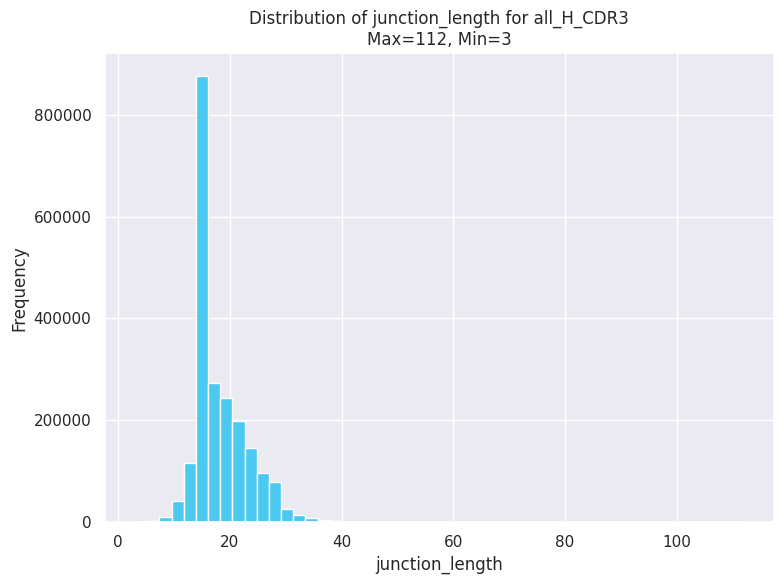

Max:  112
Min:  3


In [41]:
label = 'junction_length'

data = df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}\nMax={round(df[label].max(), 2)}, Min={round(df[label].min(), 2)}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', df[label].max())
print('Min: ', df[label].min())

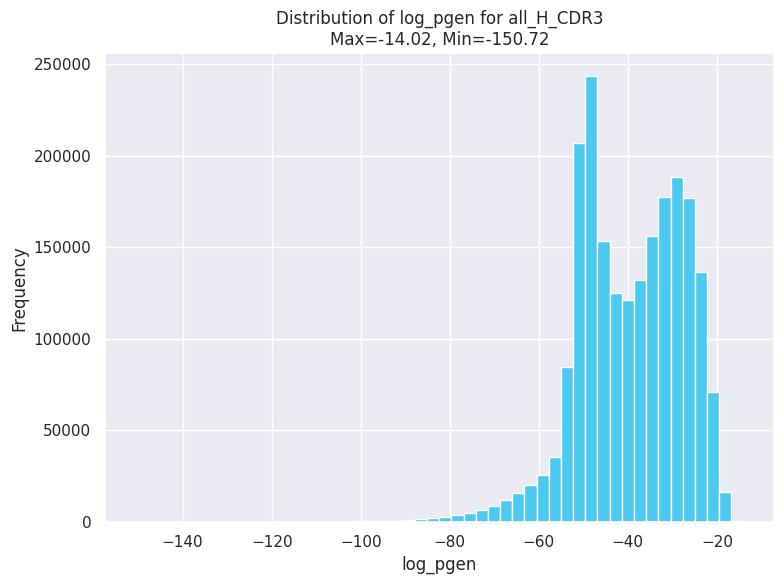

Max:  -14.017096638858614
Min:  -150.72151183975112


In [43]:
label = 'log_pgen'

data = df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}\nMax={round(df[label].max(), 2)}, Min={round(df[label].min(), 2)}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', df[label].max())
print('Min: ', df[label].min())

In [44]:
filtered_df = df[(df['junction_length'] >= 7) & (df['junction_length'] <= 40) & (df['log_pgen'] >= -80)]

filtered_df

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,...,pgen,log_pgen,x,y,v_family,d_family,j_family,vdj_comb,pgen_len_ratio,lev_dist
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,...,6.100901e-11,-23.520000,3.646490,0.685404,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.809231,9
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,...,5.055947e-21,-46.733722,5.197690,0.478494,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.749042,12
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,...,3.699200e-14,-30.928075,3.610902,3.389304,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.819299,11
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,...,1.130567e-13,-29.810887,4.079167,1.133785,IGHV3,nan,IGHJ3,IGHV3_nan_IGHJ3,-1.987392,9
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,...,3.661061e-13,-28.635853,5.148822,2.385129,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.045418,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134032,NaN,NaN,NaN,CVRNNTKGYSSSWFVAFDIW,maria,2134047,1.0,NaN,NaN,NaN,...,2.570603e-20,-45.107561,10.988966,-0.580777,nan,nan,nan,nan_nan_nan,-2.255378,13
2134033,NaN,NaN,NaN,CATSSGSANYYYYYMDVW,maria,2134048,1.0,NaN,NaN,NaN,...,1.832625e-12,-27.025272,3.347754,9.254945,nan,nan,nan,nan_nan_nan,-1.501404,12
2134034,NaN,NaN,NaN,CAKGDPEIITMIVVVTKISLYW,maria,2134049,1.0,NaN,NaN,NaN,...,6.965947e-20,-44.110668,4.431340,-1.368780,nan,nan,nan,nan_nan_nan,-2.005030,18
2134035,NaN,NaN,NaN,CASHPTTVTIHPHWFDPW,maria,2134050,1.0,NaN,NaN,NaN,...,3.170338e-15,-33.384938,3.890735,2.412232,nan,nan,nan,nan_nan_nan,-1.854719,14


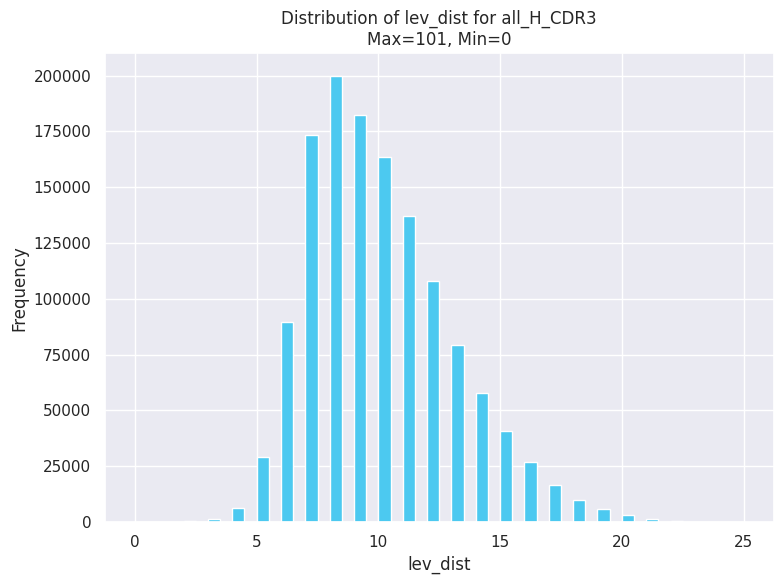

Max:  101
Min:  0


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}\nMax={round(df[label].max(), 2)}, Min={round(df[label].min(), 2)}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', df[label].max())
print('Min: ', df[label].min())

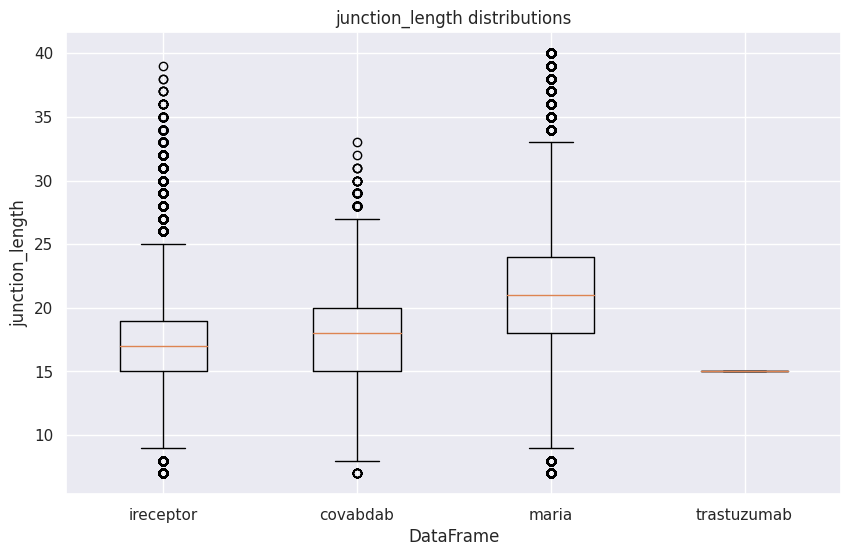

In [49]:
label = 'junction_length'

# Extract the label column from each DataFrame
label_df1 = filtered_df[filtered_df['dataset'] == 'ireceptor'][label]
label_df2 = filtered_df[filtered_df['dataset'] == 'covabdab'][label]
label_df3 = filtered_df[filtered_df['dataset'] == 'maria'][label]
label_df4 = filtered_df[filtered_df['dataset'] == 'trastuzumab'][label]

# Create a list of the extracted columns
data = [label_df1, label_df2, label_df3, label_df4]

# Create a labels list to identify each dataset
labels = ['ireceptor', 'covabdab', 'maria', 'trastuzumab']

# Create a boxplot to compare the distributions
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
#sns.violinplot(data, palette='viridis', linewidth=0.5, scale='width')
plt.title(f'{label} distributions')
plt.xlabel('DataFrame')
plt.ylabel(f'{label}')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_datasets.png'
plt.savefig(filename)

plt.show()

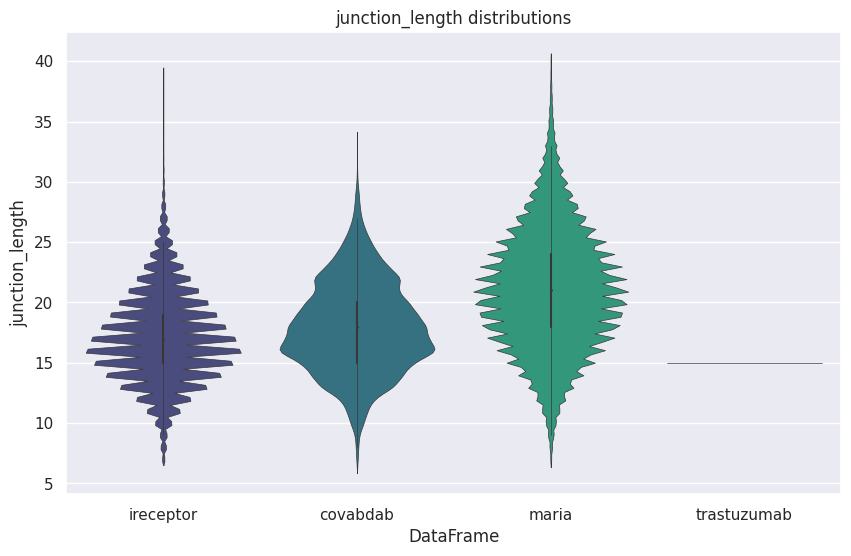

In [54]:
label = 'junction_length'

# Create long-format DataFrame
long_df = pd.DataFrame()

# Extract the label column from each DataFrame and put it into long-format DataFrame
for label_name in labels:
    temp_df = filtered_df[filtered_df['dataset'] == label_name][label]
    temp_df = temp_df.reset_index(drop=True)
    temp_df = pd.DataFrame({label: temp_df, 'dataset': label_name})
    long_df = pd.concat([long_df, temp_df], axis=0)

# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='dataset', y=label, data=long_df, order=labels, linewidth=0.5, scale='width', palette="viridis")

# Set title and labels
plt.title(f'{label} distributions')
plt.xlabel('DataFrame')
plt.ylabel(f'{label}')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_datasets.png'
plt.savefig(filename)

plt.show()

In [55]:
filtered_df.columns

Index(['Protein + Epitope', 'v_call', 'j_call', 'junction_aa', 'dataset', 'id',
       'duplicate_count', 'affinity', 'd_call', 'c_call', 'repertoire_id',
       'junction_length', 'pgen', 'log_pgen', 'x', 'y', 'v_family', 'd_family',
       'j_family', 'vdj_comb', 'pgen_len_ratio', 'lev_dist'],
      dtype='object')

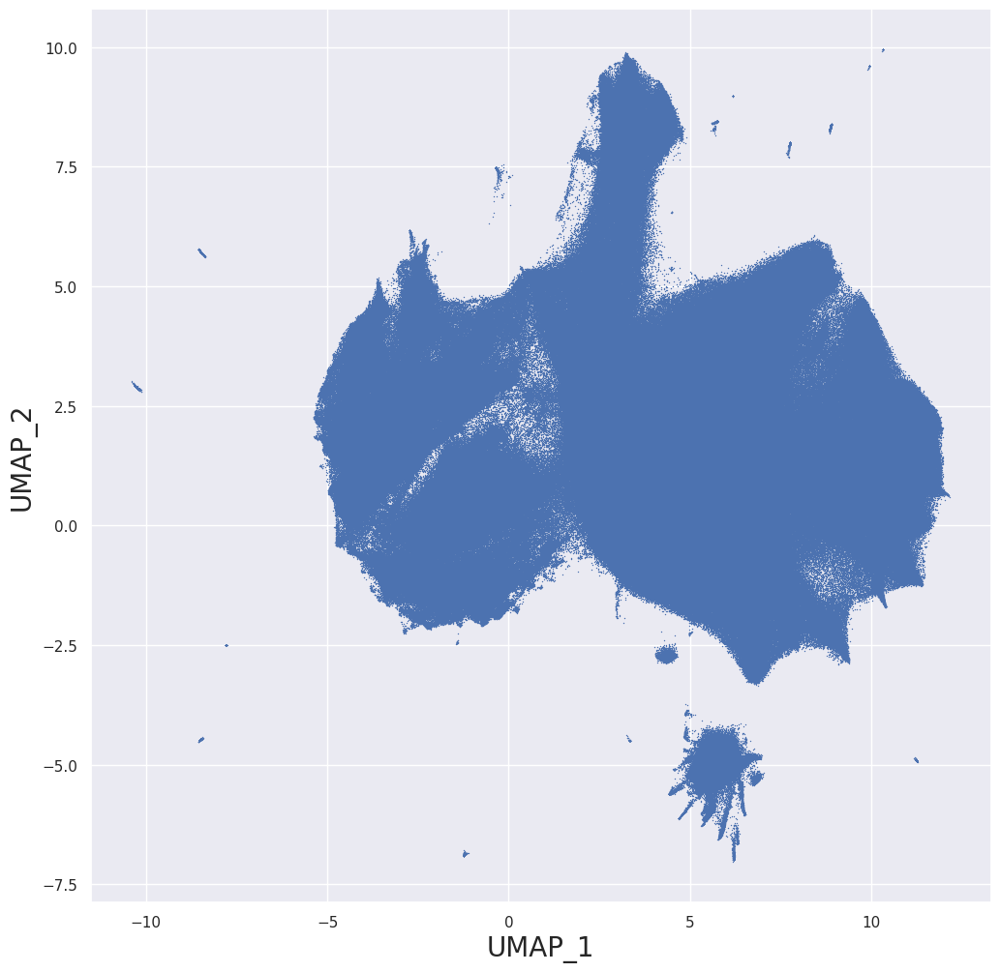

In [56]:
# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}.png')
plt.show()

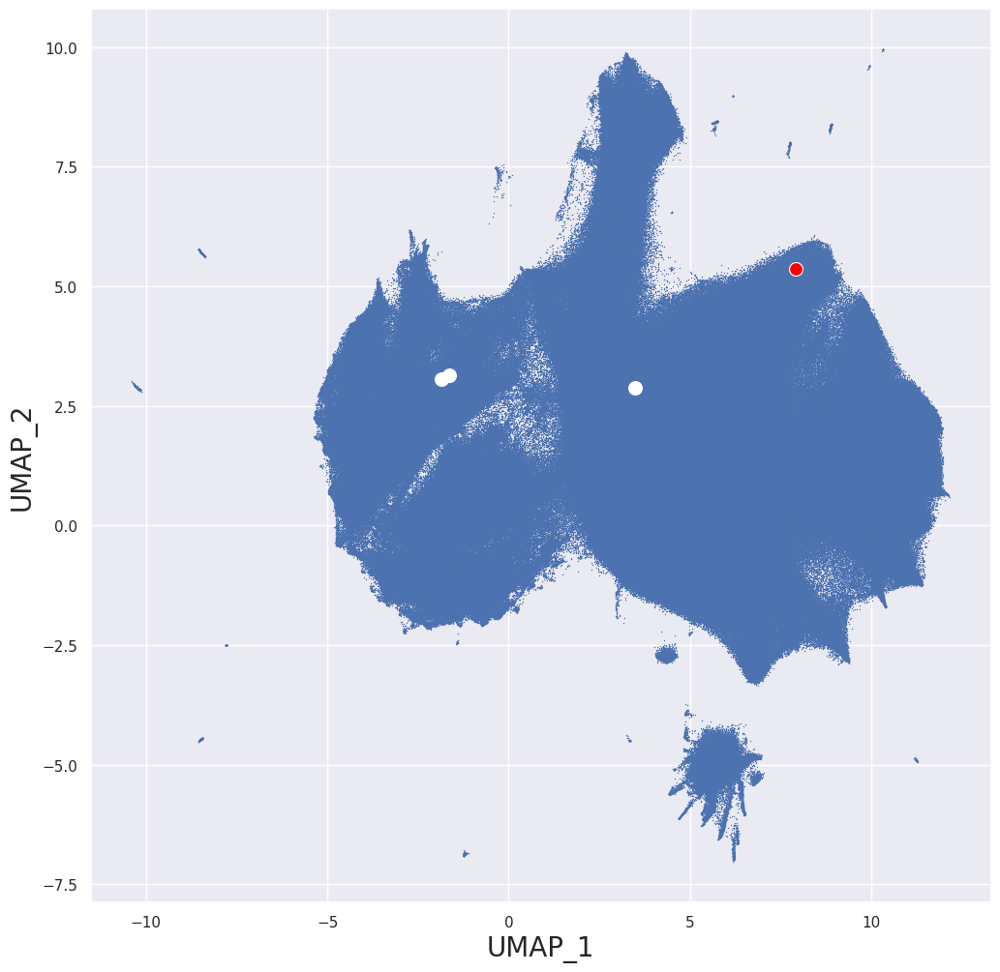

In [57]:
# Split the data
highlight_data = filtered_df[filtered_df["id"] == 1335764]
other_data = filtered_df[filtered_df["id"] != 1335764]

highlight_data2 = filtered_df[filtered_df["id"] == 193894]
highlight_data3 = filtered_df[filtered_df["id"] == 207844]
highlight_data4 = filtered_df[filtered_df["id"] == 204355]

# Create the scatterplot
plt.figure(figsize=(12, 12))

# Plot other data
scatter = sns.scatterplot(data=other_data, x='x', y='y', s=1, linewidth=0)

scatter = sns.scatterplot(data=highlight_data2, x='x', y='y', s=100, color='white')
scatter = sns.scatterplot(data=highlight_data3, x='x', y='y', s=100, color='white')
scatter = sns.scatterplot(data=highlight_data4, x='x', y='y', s=100, color='white')

# Plot highlighted data
scatter = sns.scatterplot(data=highlight_data, x='x', y='y', s=100, color='red')  # Change the size

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_WT_trastuzumab2.png')
plt.show()


## **Continuous variables**

In [58]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


In [74]:
filtered_df['junction_length'] = filtered_df['junction_aa'].apply(len)

filtered_df.columns

<ipython-input-74-dc4581e3f0ed>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['junction_length'] = filtered_df['junction_aa'].apply(len)


Index(['Protein + Epitope', 'v_call', 'j_call', 'junction_aa', 'dataset', 'id',
       'duplicate_count', 'affinity', 'd_call', 'c_call', 'repertoire_id',
       'junction_length', 'pgen', 'log_pgen', 'x', 'y', 'v_family', 'd_family',
       'j_family', 'vdj_comb', 'pgen_len_ratio', 'lev_dist'],
      dtype='object')

<ipython-input-76-3c6aaaa45bdf>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-76-3c6aaaa45bdf>:20: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


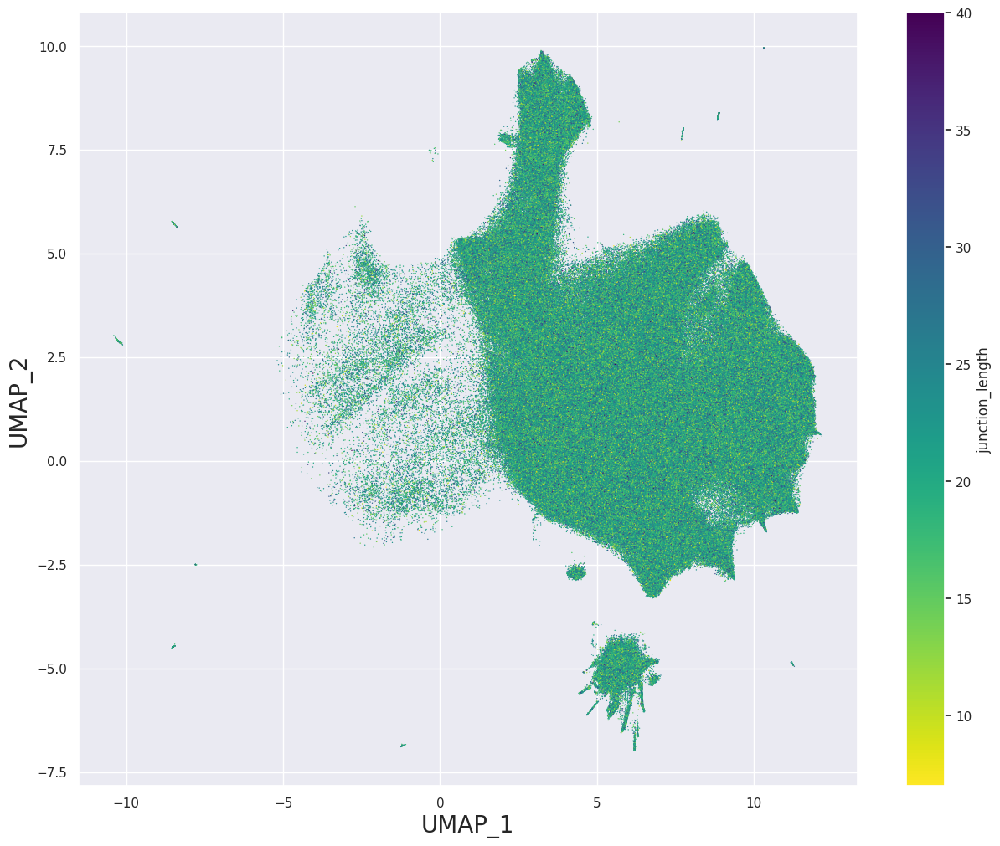

In [76]:
hue_name = 'junction_length'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

subset = filtered_df[(filtered_df['dataset'] == 'maria')]

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=subset, x='x', y='y', s=1, linewidth=0, c=subset[hue_name], cmap=reversed_cmap)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=reversed_cmap, norm=plt.Normalize(vmin=subset[hue_name].min(), vmax=subset[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_maria.png')
plt.show()

<ipython-input-63-c84c18d544b0>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-63-c84c18d544b0>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


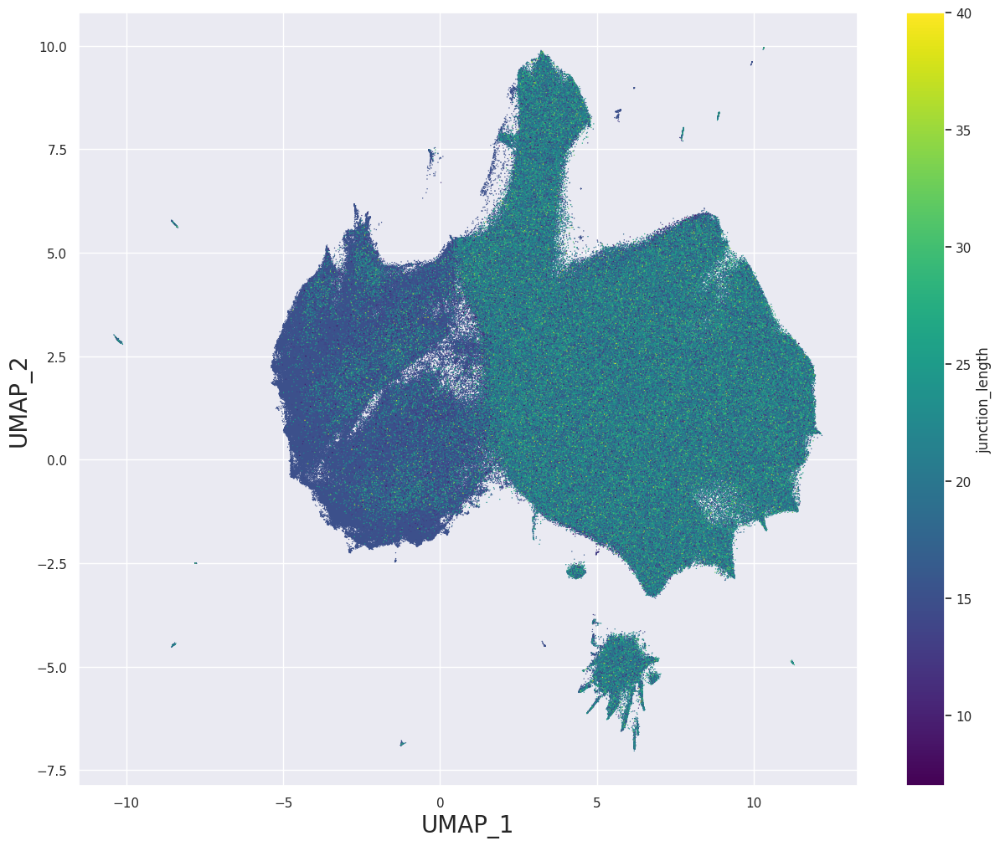

In [63]:
hue_name = 'junction_length'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

<ipython-input-124-85ecba42c697>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-124-85ecba42c697>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


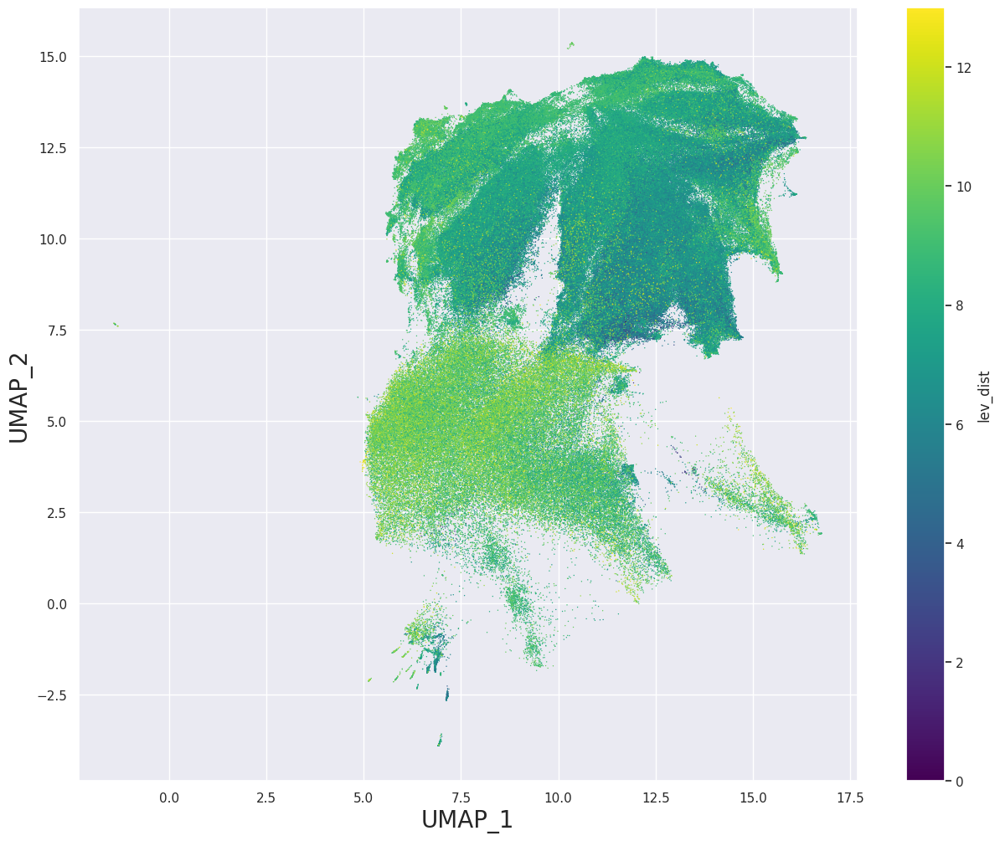

In [ ]:
hue_name = 'lev_dist'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df[filtered_df['junction_length'] == 15], x='x', y='y', s=1, linewidth=0, c=filtered_df[filtered_df['junction_length'] == 15][hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[filtered_df['junction_length'] == 15][hue_name].min(), vmax=filtered_df[filtered_df['junction_length'] == 15][hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_15.png')
plt.show()

<Figure size 1200x1200 with 0 Axes>

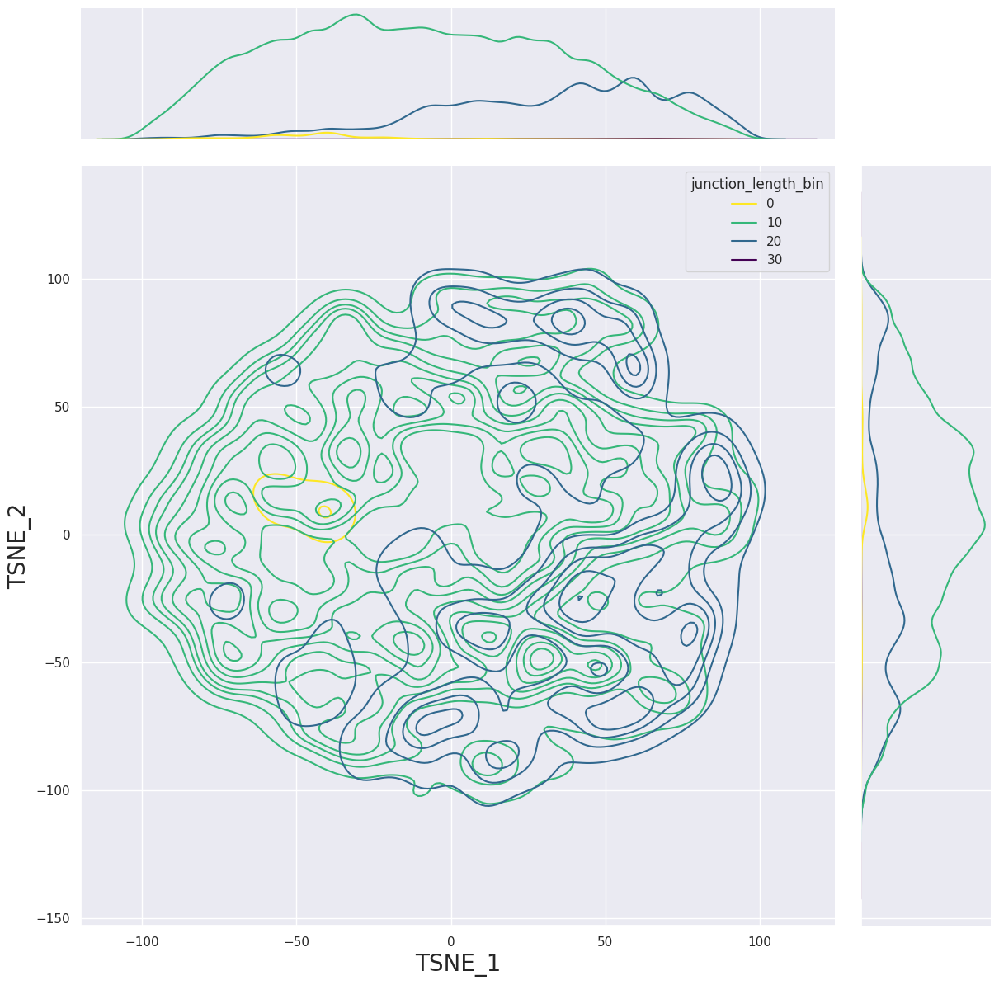

In [ ]:
hue_name = 'log_pgen'

# Calculate the bins for junction lengths with a bin width of 4
bin_width = 10
filtered_df[f'{hue_name}_bin'] = (filtered_df[hue_name] // bin_width) * bin_width

plt.figure(figsize=(12, 12))
#sns.kdeplot(data=umap_df, x='x', y='y', fill=True)
sns.jointplot(data=filtered_df, x='x', y='y', kind='kde', hue=f'{hue_name}_bin', fill=False, height=12, palette=reversed_cmap)
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)
plt.savefig(f'{model_name}_{red}_KDE_{dataset_name}_{hue_name}.png')
plt.show()

## **Class features**

In [ ]:
filtered_df.columns

Index(['Protein + Epitope', 'v_call', 'j_call', 'junction_aa', 'dataset', 'id',
       'duplicate_count', 'affinity', 'd_call', 'c_call', 'repertoire_id',
       'junction_length', 'x', 'y', 'v_family', 'd_family', 'j_family'],
      dtype='object')

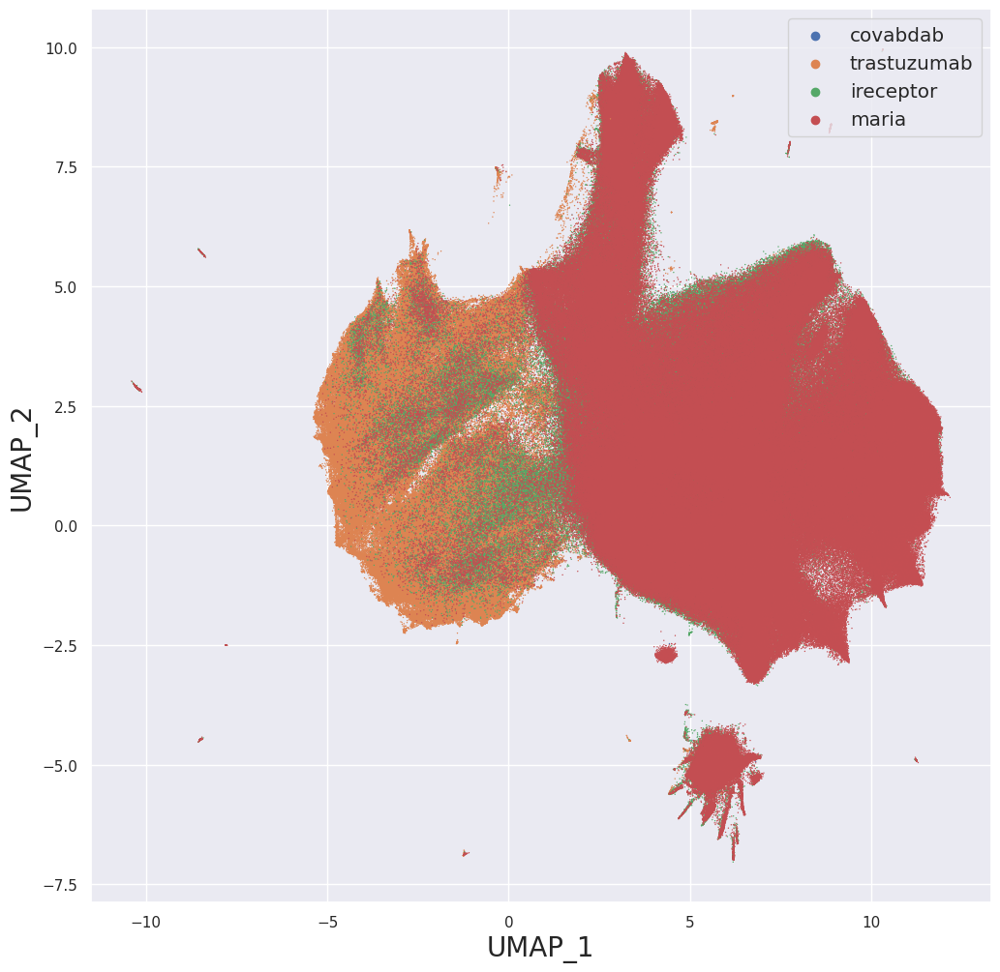

In [ ]:
# Define hue_name
hue_name = 'dataset'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

#scatter.legend_.remove()

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

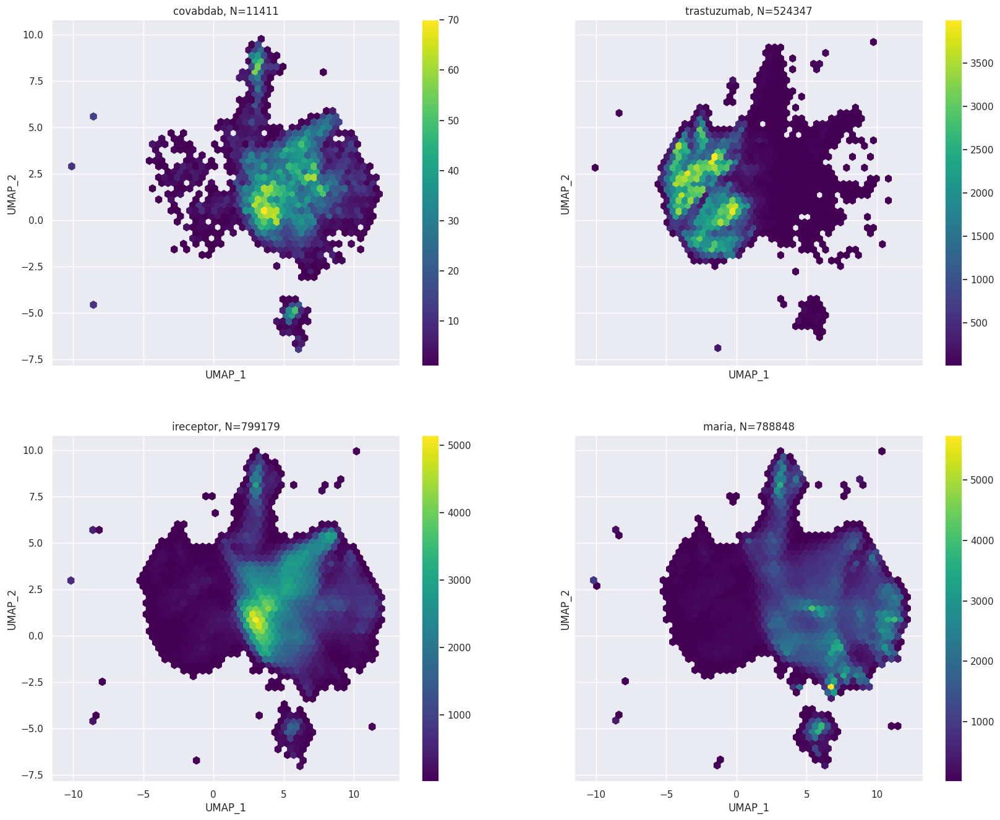

In [62]:
hue_name = 'dataset'

gridsize = 50

# Get the unique classes
unique_classes = filtered_df[hue_name].unique()

# Calculate the number of rows and columns based on the number of unique classes
num_classes = len(unique_classes)
num_rows = int(num_classes**0.5)
num_cols = (num_classes + num_rows - 1) // num_rows

# Calculate the figure size to fit the square subplots and maintain the overall aspect ratio
fig_width = 20
fig_height = 16 * (num_rows / num_cols)

# Create a grid of subplots with equal aspect ratio
fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through the unique classes and create hexbin plots with titles
for i, el in enumerate(unique_classes):
    ax = axes[i]
    x_data = filtered_df[filtered_df[hue_name] == el]['x']
    y_data = filtered_df[filtered_df[hue_name] == el]['y']

    # Set the aspect ratio to be equal (square)
    #ax.set_aspect('equal')

    num_data_points = len(x_data)

    # Create a hexbin plot
    hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')

    ax.set_title(f'{el}, N={num_data_points}')
    ax.set_xlabel(f'{red}_1', fontsize=12)
    ax.set_ylabel(f'{red}_2', fontsize=12)

    plt.colorbar(hb, ax=ax)  # Add colorbar

# Remove any empty subplots if the number of plots doesn't fill the grid
for i in range(num_classes, num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust layout to remove the gap between rows and columns
#plt.subplots_adjust(hspace=0, wspace=0)

# Display the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_hexbin_sep_by_{hue_name}.png')
plt.show()

In [ ]:
!zip -r /content/prott5.zip /content/prott5*

  adding: content/prott5_UMAP_H_CDR3_d_family.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_j_family.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_junction_length.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_log_pgen.png (deflated 1%)
  adding: content/prott5_UMAP_H_CDR3_v_family.png (deflated 2%)


## **Repertoires**

In [ ]:
print(len(filtered_df.repertoire_id.unique()))

count = filtered_df['repertoire_id'].value_counts()
print(count)

251
2892713941286916586-242ac113-0001-012    19389
2873730185838596586-242ac113-0001-012    16549
2918440795389956586-242ac113-0001-012    15293
3221665486487556586-242ac113-0001-012    15118
1047746754101308950-242ac113-0001-012    14875
                                         ...  
6084885090374324716-242ac114-0001-012        1
6054863268975284716-242ac114-0001-012        1
6078786236814004716-242ac114-0001-012        1
6066373781328564716-242ac114-0001-012        1
6067018026422964716-242ac114-0001-012        1
Name: repertoire_id, Length: 250, dtype: int64


TypeError: ignored

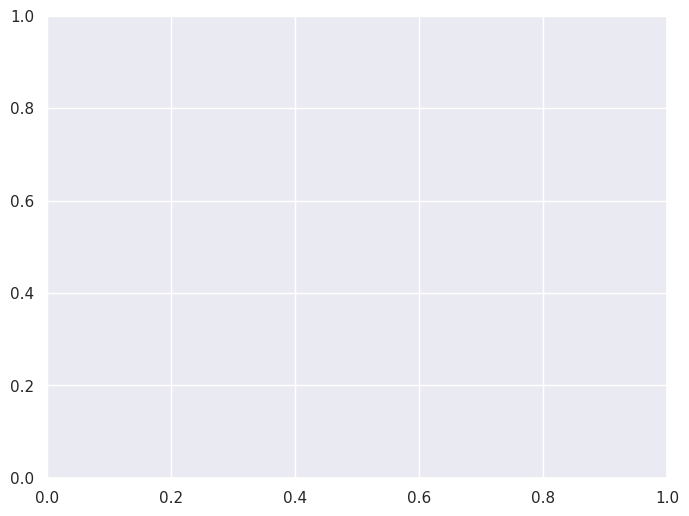

In [ ]:
label = 'repertoire_id'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
#plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
print(count[0:16])

rep_ids = count[0:16].index

2892713941286916586-242ac113-0001-012    19389
2873730185838596586-242ac113-0001-012    16549
2918440795389956586-242ac113-0001-012    15293
3221665486487556586-242ac113-0001-012    15118
1047746754101308950-242ac113-0001-012    14875
1025069326778428950-242ac113-0001-012    14716
2804108765970436586-242ac113-0001-012    13953
2669762188951556586-242ac113-0001-012    13919
2644722529615876586-242ac113-0001-012    13424
2942020165844996586-242ac113-0001-012    13224
891281095508028950-242ac113-0001-012     12972
3203411875479556586-242ac113-0001-012    11635
1381079165943868950-242ac113-0001-012    11110
3046731468521476586-242ac113-0001-012    11038
3183182579515396586-242ac113-0001-012    10892
856577759756348950-242ac113-0001-012     10557
Name: repertoire_id, dtype: int64


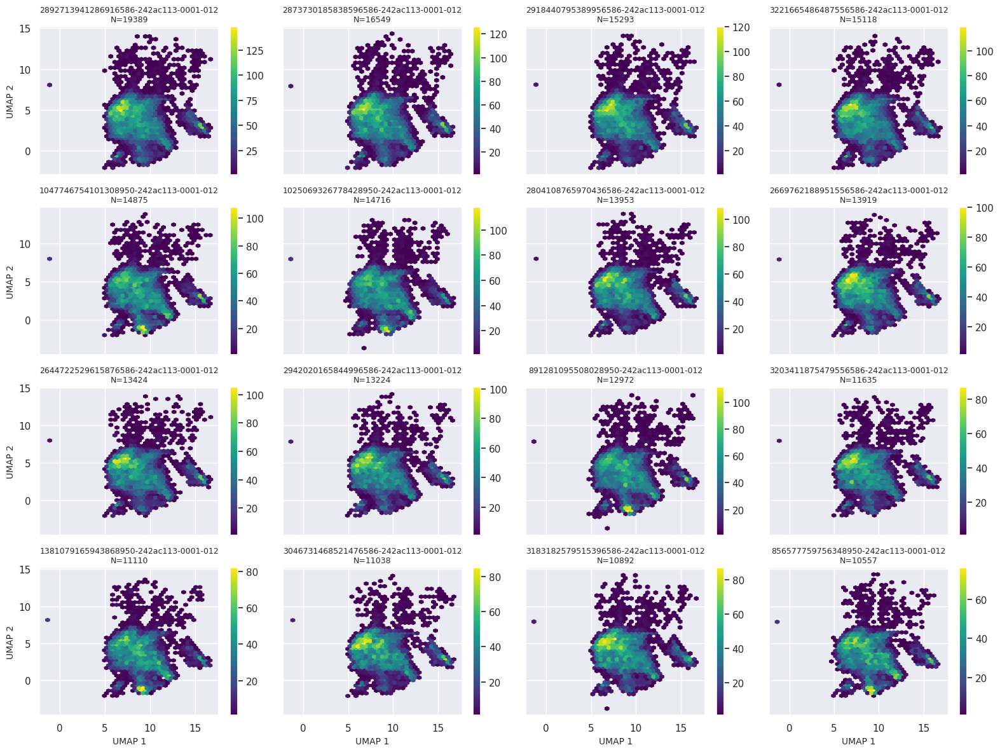

In [ ]:
label = 'repertoire_id'

x_dim = 4
y_dim = 4
gridsize = 40  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = rep_ids[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'{rep_ids[c-1]}\nN={num_data_points}', fontsize=9)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel(f'{red} 1', fontsize=10)
    axes[i, 0].set_ylabel(f'{red} 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{red}_{dataset_name}_sep_by_{label}.png')

# Show the plot
plt.show()

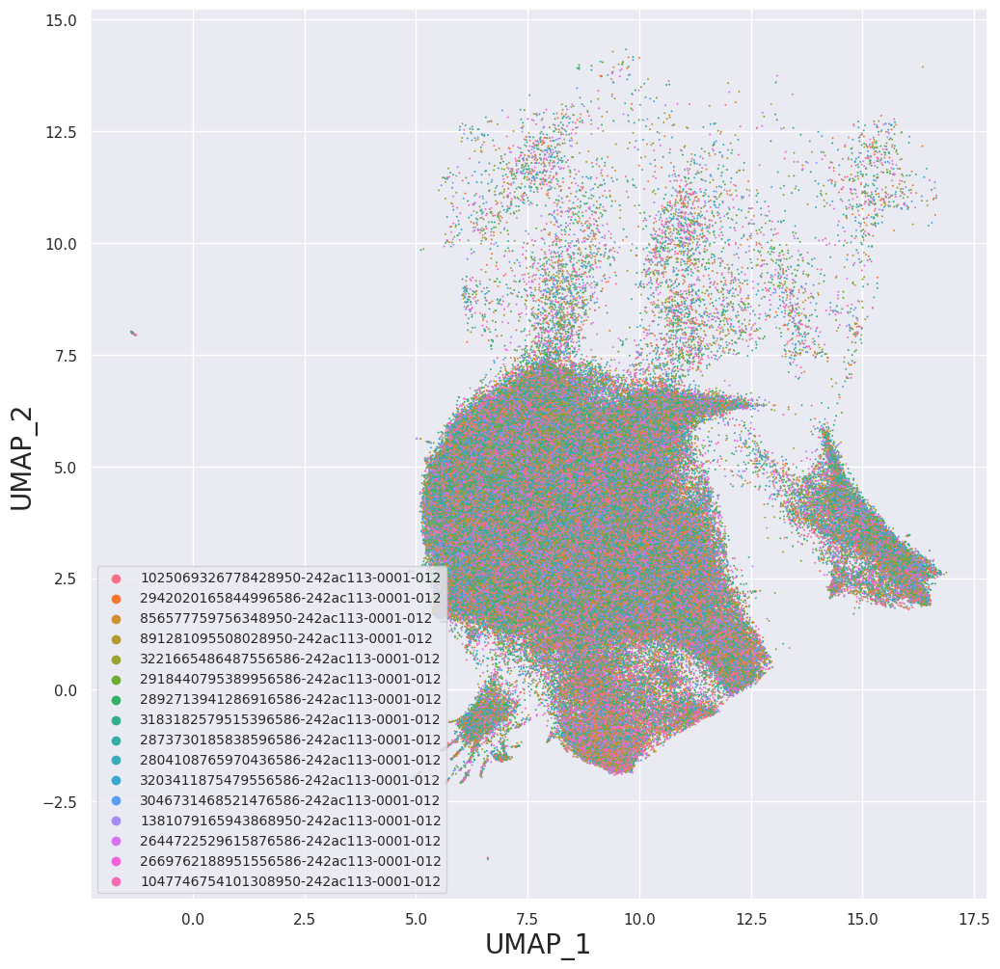

In [ ]:
# Define hue_name
hue_name = 'repertoire_id'

# Filter the DataFrame to include only the specified classes
filtered_df_filtered = filtered_df[filtered_df[hue_name].isin(rep_ids)]

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df_filtered, x='x', y='y', s=2, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='lower left', fontsize='small')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

## **Covabadab**

In [ ]:
filtered_df[filtered_df['dataset'] == 'covabdab']['Protein + Epitope'].unique()

array(['S; RBD', 'S; non-RBD', 'S; NTD', 'S; S2 Stem Helix', 'S; S2',
       'S; NTD-SD1', 'Nsp9', "S; S2' Cleavage Site/Fusion Peptide NTD",
       'S; SD1', 'S; S1 non-RBD', 'S; S2 Fusion Peptide', 'S; Stem Helix',
       'S; Unk', 'N; NTD', 'M', 'S; probably RBD (implied by clustering)',
       'CSP ', nan, 'Unknown', 'S; S2 (quaternary glycan epitope)',
       'S; RBD/non-RBD', 'S; S1/S2 Cleavage Site', 'N', 'S', 'S; S1/S2',
       'E', 'S; S1', 'S; Possibly RBD', 'Mpro', 'Nsp3; PLpro', 'N; RBD',
       'N; CTD', 'S; non-S1', 'TBC', 'S2 (quaternary glycan epitope)',
       'S: NTD', 'S: RBD', "S; S2' Cleavage Site/Fusion Peptide",
       'S1; non-RBD', 'S; RBD/NTD'], dtype=object)

In [ ]:
print(len(filtered_df[filtered_df['dataset'] == 'covabdab']['Protein + Epitope'].unique()))

count = filtered_df[filtered_df['dataset'] == 'covabdab']['Protein + Epitope'].value_counts()
print(count)

40
S; RBD                                     7593
S; Unk                                     2321
S; NTD                                      574
S; non-RBD                                  413
S; S2                                       287
N                                            48
S; S1 non-RBD                                42
S; non-S1                                    33
S; Possibly RBD                              31
S; S1                                        26
Unknown                                      13
S1; non-RBD                                  11
S; S2 Stem Helix                              9
S; RBD/non-RBD                                8
S; S2 Fusion Peptide                          7
S; S2' Cleavage Site/Fusion Peptide NTD       6
N; NTD                                        6
S; Stem Helix                                 3
Nsp3; PLpro                                   3
M                                             3
N; RBD                               

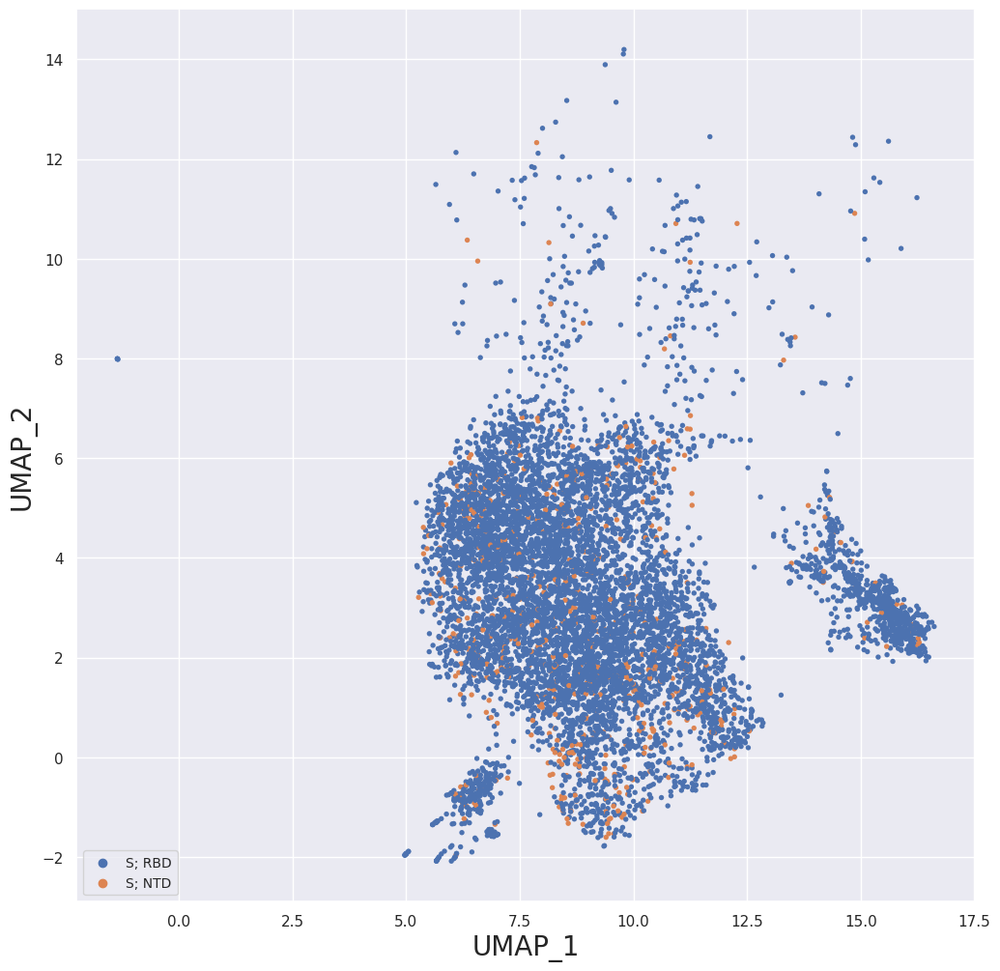

In [ ]:
rep_ids = ['S; NTD', 'S; RBD']

# Define hue_name
hue_name = 'Protein + Epitope'

# Filter the DataFrame to include only the specified classes
filtered_df_filtered = filtered_df[filtered_df[hue_name].isin(rep_ids)]

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df_filtered, x='x', y='y', s=15, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='lower left', fontsize='small')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

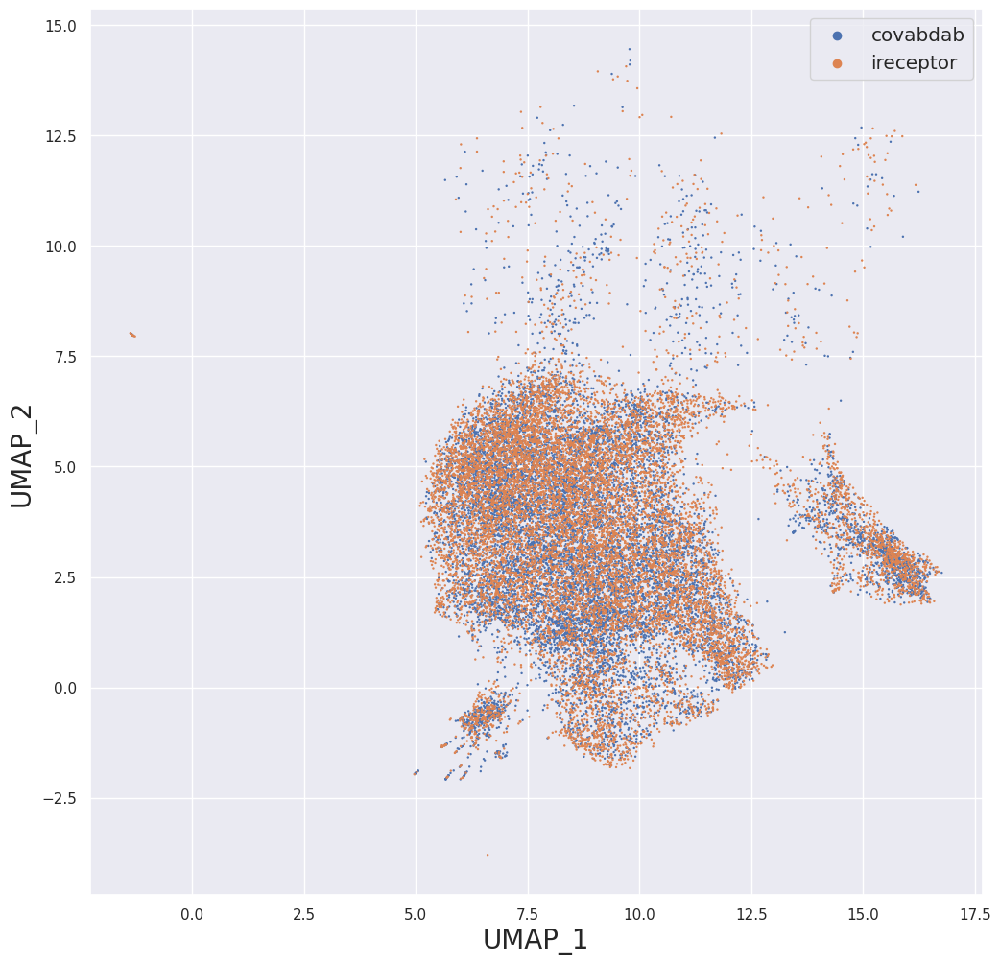

In [ ]:
# Define hue_name
hue_name = 'dataset'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df[(filtered_df['dataset'] != 'trastuzumab')].head(24000), x='x', y='y', s=3, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

## **Trastuzumab**

In [ ]:
filtered_df['affinity'] = filtered_df['affinity'].fillna('lb')

array(['lb', 'hb', 'mb'], dtype=object)

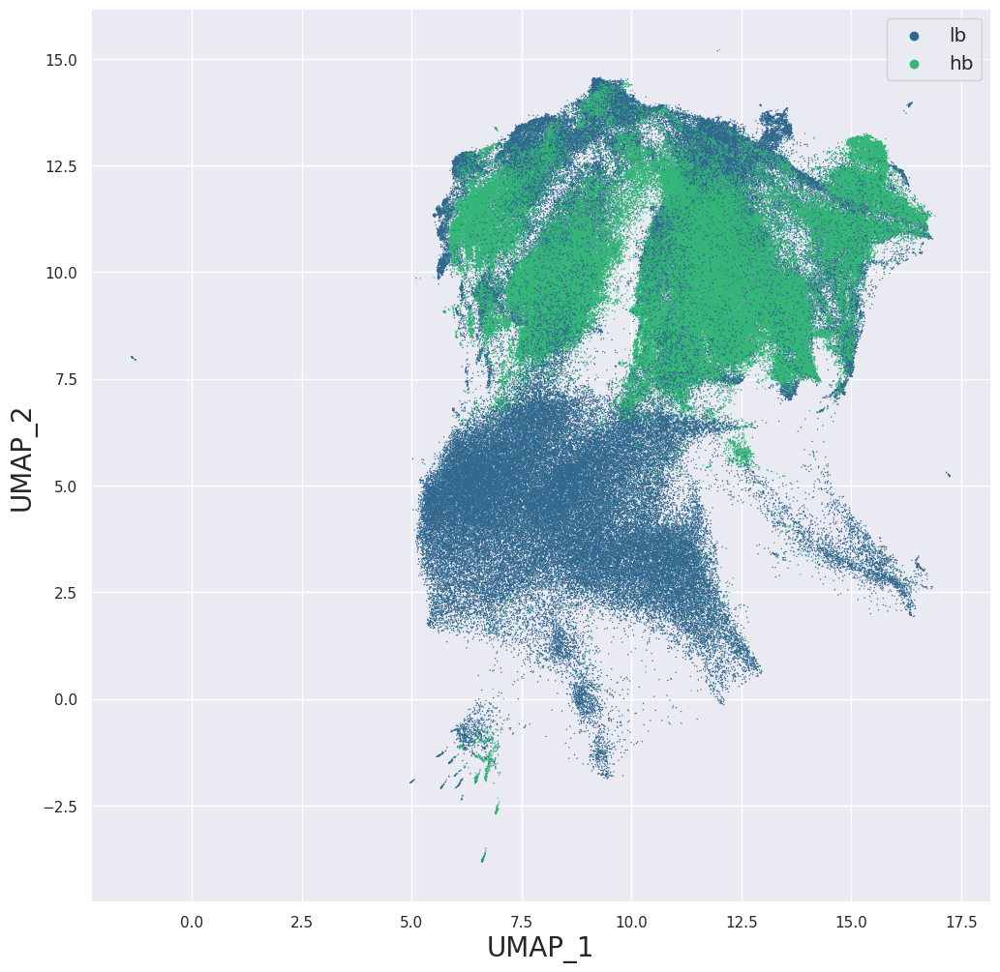

In [ ]:
# Define hue_name
hue_name = 'affinity'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df[(filtered_df['junction_length'] == 15) & (filtered_df['dataset'] != 'covabdab') & (filtered_df['affinity'] != 'mb')], x='x', y='y', s=1, linewidth=0, hue=hue_name, palette='viridis')

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_15.png')
plt.show()

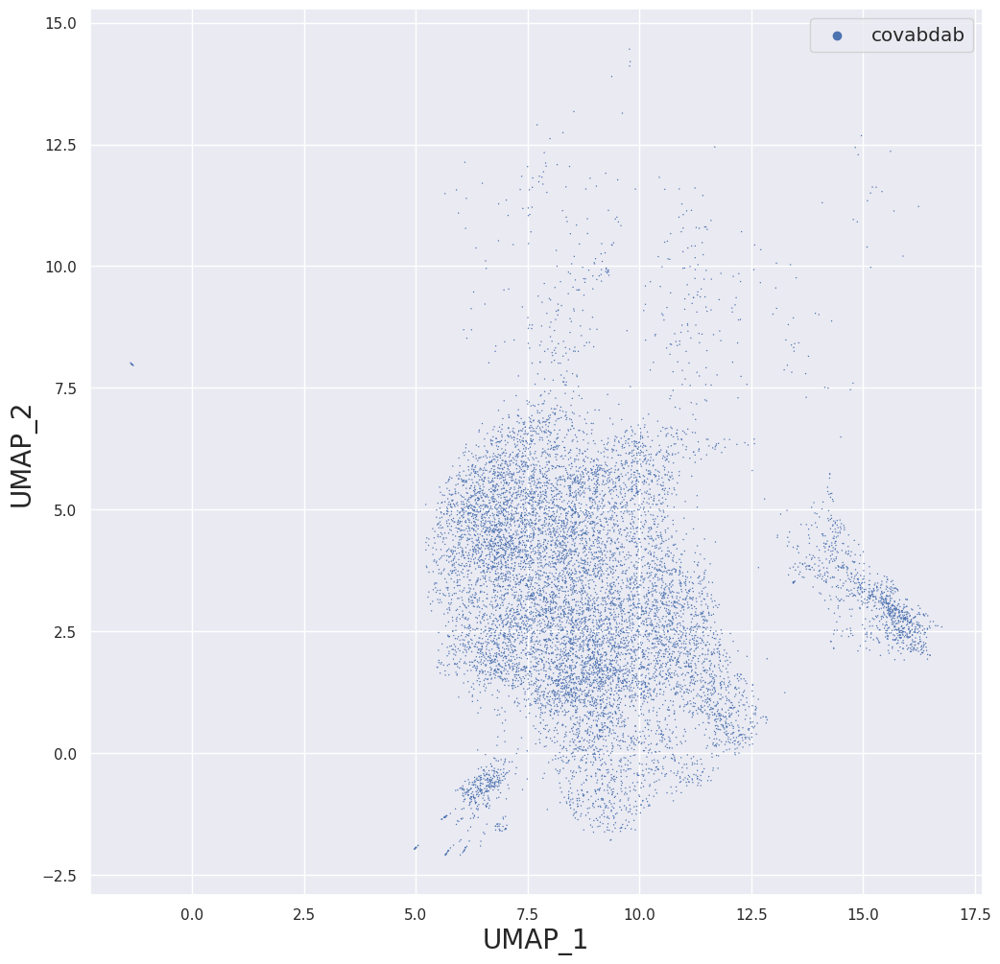

In [ ]:
# Define hue_name
hue_name = 'dataset'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df[(filtered_df['dataset'] == 'covabdab')], x='x', y='y', s=1, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_covabdab.png')
plt.show()

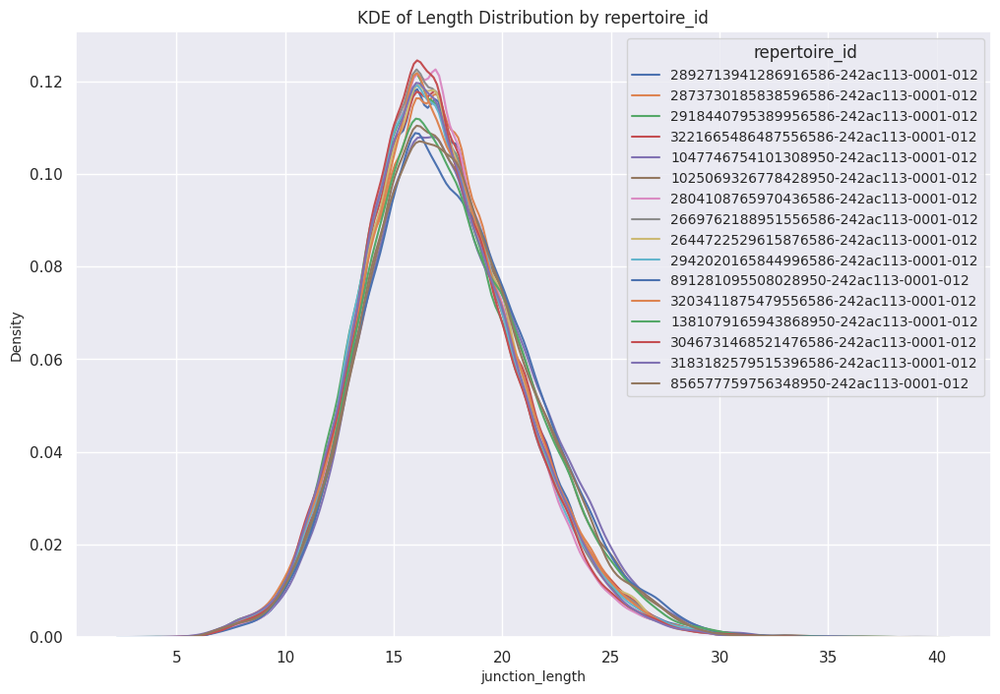

In [ ]:
# Define hue_name
hue_name = 'repertoire_id'
label = 'junction_length'

# Create a figure for the combined KDE plots
plt.figure(figsize=(12, 8))

# Loop through the cutoff values and create KDE plots
for cutoff in rep_ids:
    data = filtered_df[filtered_df[hue_name] == cutoff][label]

    sns.kdeplot(data, label=f'{cutoff}')

# Add labels and a legend
plt.xlabel('junction_length', fontsize=10)
plt.ylabel('Density', fontsize=10)
plt.title(f'KDE of Length Distribution by {hue_name}', fontsize=12)
plt.legend(title=hue_name, loc='upper right', fontsize='small')

# Save and show the plot
plt.savefig(f'{model_name}_{dataset_name}_kde_length_distr_by_{hue_name}.png')
plt.show()

# **Interactive length plots**

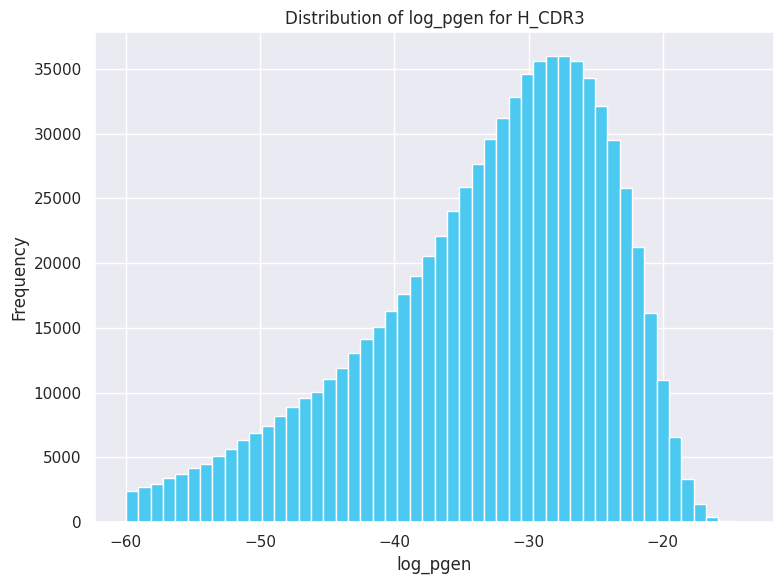

Max:  -14.017096638858614
Min:  -59.99997348303131


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', filtered_df[label].max())
print('Min: ', filtered_df[label].min())

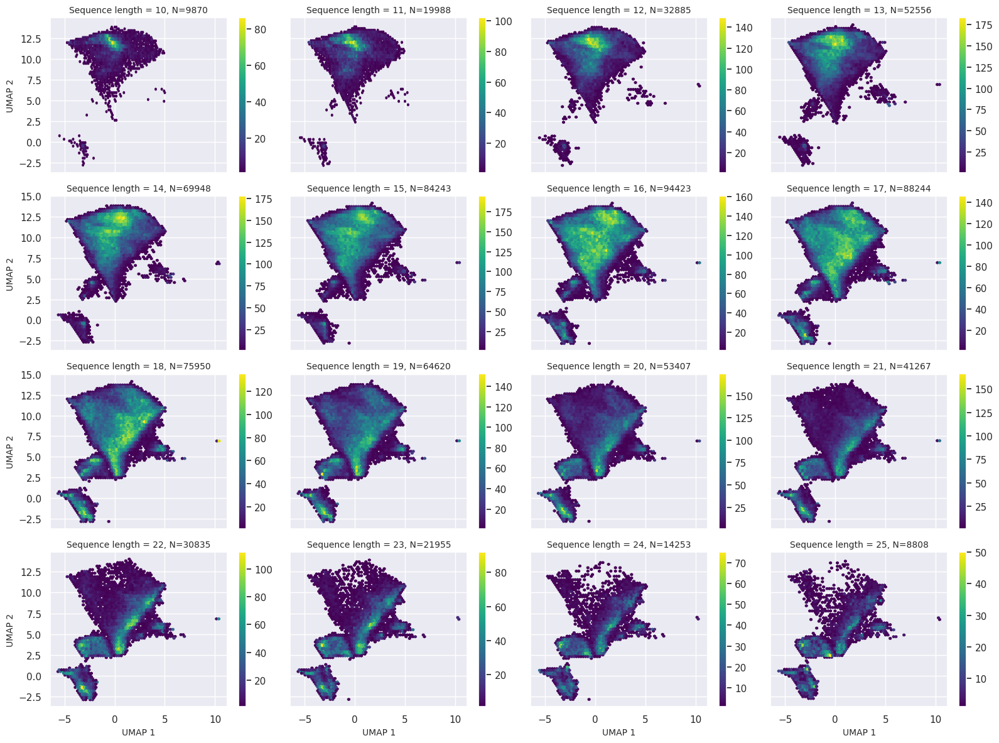

In [ ]:
cutoff_values = np.arange(10, 26, 1)
label = 'junction_length'

x_dim = 4
y_dim = 4
alpha = 0.05
gridsize = 70  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'Sequence length = {cutoff}, N={num_data_points}', fontsize=10)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{label}_{dataset_name}_hexbin.png')

# Show the plot
plt.show()

## **Divide by one label and color by another one**

In [ ]:
new_filtered_df = filtered_df[(filtered_df['log_pgen'] >= -60)]

In [ ]:
cutoff_values = np.arange(10, 26, 1)
len(cutoff_values)

16

<ipython-input-170-dd452d279bd0>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)


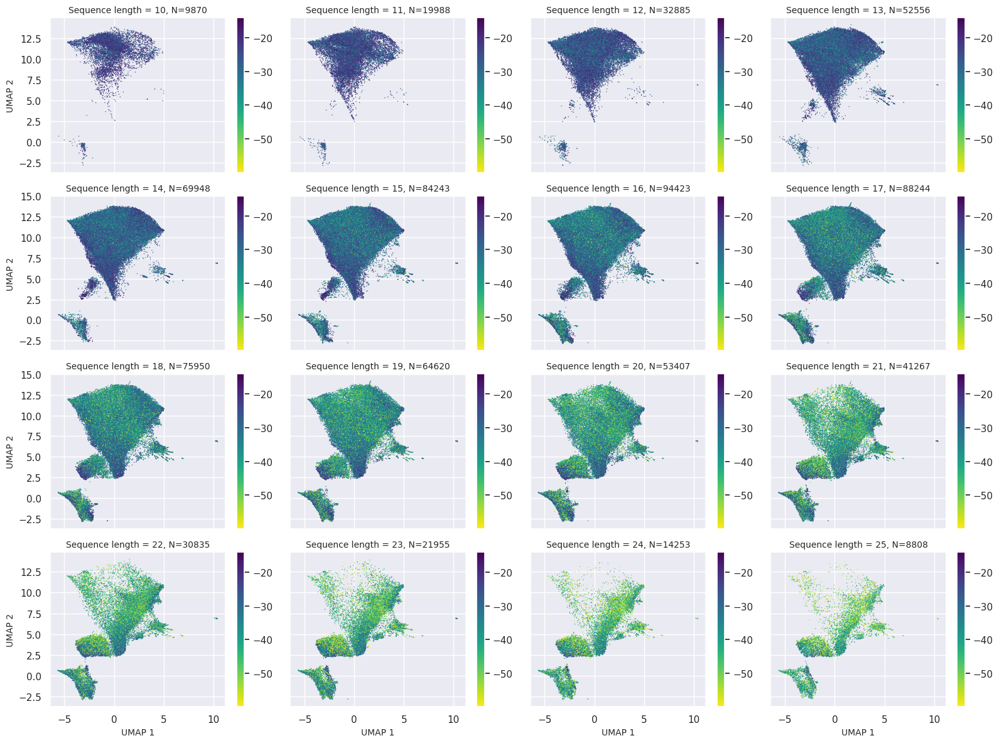

In [ ]:
label = 'junction_length'
hue_name = 'log_pgen'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

x_dim = 4
y_dim = 4

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Calculate the overall min and max values for 'log_pgen' in filtered_df
global_min_log_pgen = new_filtered_df[hue_name].min()
global_max_log_pgen = new_filtered_df[hue_name].max()

# Create a consistent normalization object for the global color scale
norm = plt.Normalize(vmin=global_min_log_pgen, vmax=global_max_log_pgen)

# Create a single colorbar using the consistent normalization
sm = cm.ScalarMappable(cmap=reversed_cmap, norm=norm)
sm.set_array([])

# Loop through the cutoff values and create scatter plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]

        # Filter the data based on the 'junction_length' value
        subset = new_filtered_df[new_filtered_df[label] == cutoff]

        # Create the scatterplot
        scatter = sns.scatterplot(data=subset, x='x', y='y', s=1, linewidth=0, c=subset[hue_name], cmap=reversed_cmap, ax=ax, norm=norm)

        num_data_points = len(subset)
        ax.set_title(f'Sequence length = {cutoff}, N={num_data_points}', fontsize=10)

        # Add the consistent colorbar for 'hue_name'
        cbar = plt.colorbar(sm, label='', ax=ax)

        # Add a legend to the plot
        ax.legend().remove()

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
for i in range(y_dim):
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

# Add a single legend for the entire plot
#handles, labels = scatter.get_legend_handles_labels()
#fig.legend(handles, labels, loc='center right', title=hue_name)

plt.savefig(f'{model_name}_sep_{label}_col_{hue_name}_{dataset_name}_scatter.png')

# Show the plot
plt.show()


## **Plots for continuous values**

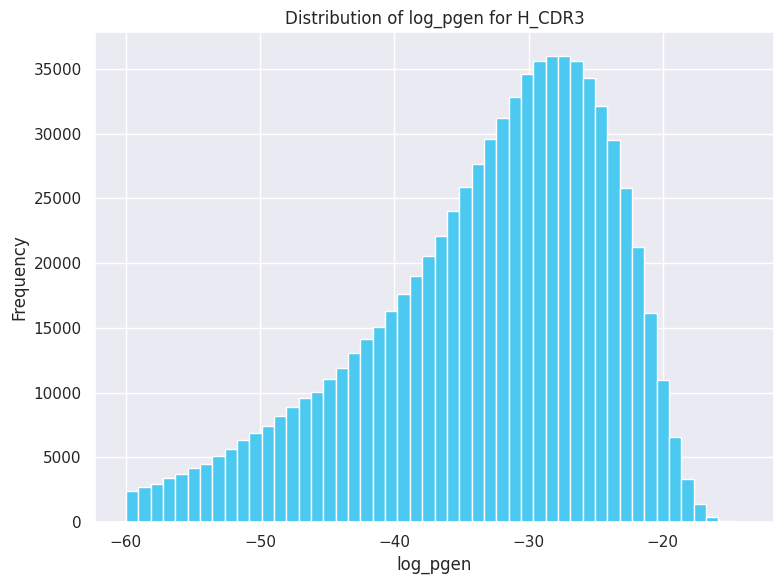

Max:  -14.017096638858614
Min:  -59.99997348303131


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', filtered_df[label].max())
print('Min: ', filtered_df[label].min())

In [ ]:
# Calculate the bins for junction lengths with a bin width of bin_width
bin_width = 3
filtered_df['log_pgen_bin'] = (filtered_df['log_pgen'] // bin_width) * bin_width
filtered_df['log_pgen_bin'] = filtered_df['log_pgen_bin'].astype(int)

In [ ]:
len(filtered_df['log_pgen_bin'].unique())

16

In [ ]:
np.sort(filtered_df['log_pgen_bin'].unique())

array([-60, -57, -54, -51, -48, -45, -42, -39, -36, -33, -30, -27, -24,
       -21, -18, -15])

In [ ]:
cutoff_values = np.arange(-15, -63, -3)
print(cutoff_values)
len(cutoff_values)

[-15 -18 -21 -24 -27 -30 -33 -36 -39 -42 -45 -48 -51 -54 -57 -60]


16

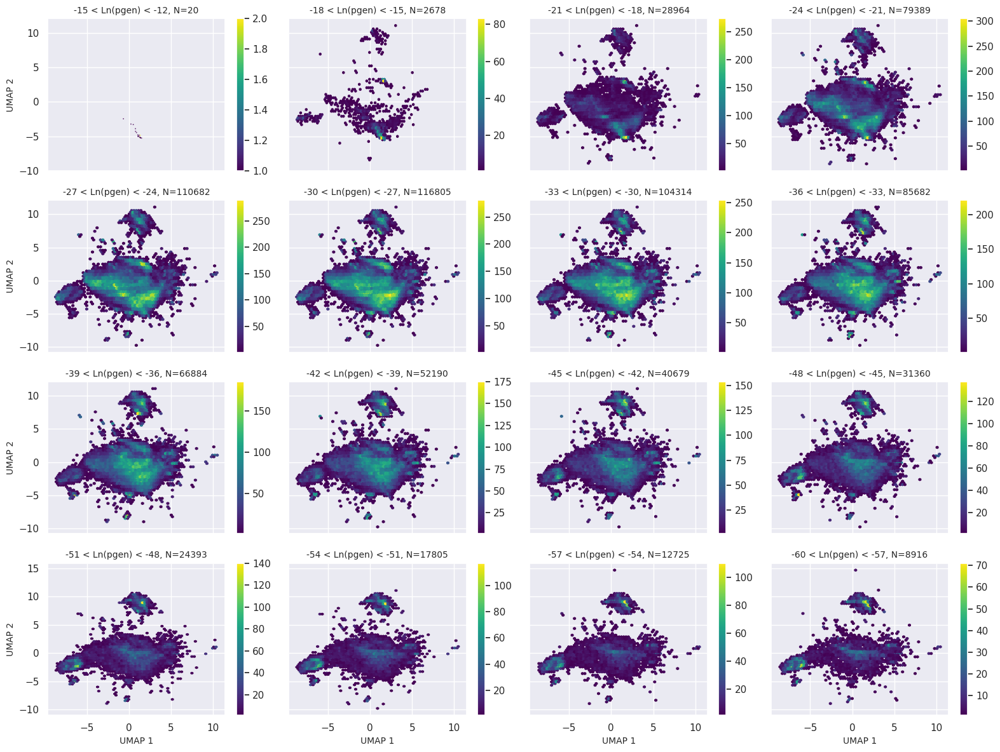

In [ ]:
label = 'log_pgen_bin'

x_dim = 4
y_dim = 4
alpha = 0.05
gridsize = 70  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'{cutoff} < Ln(pgen) < {cutoff+3}, N={num_data_points}', fontsize=10)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
for i in range(y_dim):
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{label}_{dataset_name}_hexbin.png')

# Show the plot
plt.show()

# **Create Maria's dataset**

In [ ]:
maria_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/maria/BCR_mixcr_productive.clonotypes.IGH.txt', sep='\t')
columns_to_keep = ['cloneCount', 'aaSeqCDR3']
columns_to_drop = maria_metadata.columns.difference(columns_to_keep)
maria_metadata = maria_metadata.drop(columns=columns_to_drop)
maria_metadata = maria_metadata.rename(columns={'cloneCount': 'duplicate_count', 'aaSeqCDR3': 'junction_aa'})

# Drop rows where junction_aa doesn't start with C and end with W
maria_metadata = maria_metadata[(maria_metadata['junction_aa'].str.startswith('C') & maria_metadata['junction_aa'].str.endswith('W'))]

# Drop rows with *
maria_metadata = maria_metadata.loc[~maria_metadata['junction_aa'].str.contains('\*')]

# Sample 800k random rows
maria_metadata = maria_metadata.sample(n=800000)

maria_metadata['id'] = range(1, len(maria_metadata) + 1)
maria_metadata['dataset'] = 'maria'

maria_metadata

ParserError: ignored